In [21]:
import geopandas as gpd
from libpysal.weights import Queen, Rook
import pandas as pd
import numpy as np
from matplotlib.colors import ListedColormap
import geopandas as gpd
import matplotlib.colors as mcolors
from matplotlib.cm import ScalarMappable
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.pyplot as plt
import os
from matplotlib.lines import Line2D

In [2]:
def bwr_no_white(cut=0.14, N=16):

    base = plt.get_cmap('bwr_r')
    x_left  = np.linspace(0.0, 0.5 - cut/2, N//2, endpoint=False)
    x_right = np.linspace(0.5 + cut/2, 1.0,     N//2)
    colors = np.vstack([base(x_left), base(x_right)])
    return mcolors.ListedColormap(colors, name='bwr_no_white')

def plot_maps(
    df: pd.DataFrame,
    fields,
    coord_cols=("proj_X","proj_Y"),
    *,
    title=None,
    ncols=4, s=6, alpha=0.9,
    cmap="bwr_r",
    share_norm=False,
    cmap_disc=True,
    v_range=[-0.8, 0.8, 17],
    figsize_per_cell=(7, 5),
    save_path=None,
    poly_gdf: "gpd.GeoDataFrame | None" = None,
    hide_frame=True,
    wspace=0.005, hspace=0.03,
    cbar_pad=0.005, cbar_height=0.025,
):
    x = df[coord_cols[0]].to_numpy()
    y = df[coord_cols[1]].to_numpy()

    vals = [df[f].to_numpy(dtype=float) for f in fields]
    if share_norm:
        vmin = np.nanmin([np.nanmin(v) for v in vals])
        vmax = np.nanmax([np.nanmax(v) for v in vals])
    else:
        vmin = vmax = None
    if v_range:
        vmin, vmax, v_n = v_range

    n = len(fields)
    ncols = int(ncols)
    nrows = (n + ncols - 1) // ncols

    if cmap_disc:
        bins = np.linspace(vmin, vmax, v_n)
        base = plt.get_cmap(cmap)
        #mids = 0.5 * (bins[:-1] + bins[1:])
        mids = bins[:-1]
        norm_full = mcolors.Normalize(vmin=bins[0], vmax=bins[-1])
        colors = base(norm_full(mids))
        #cmap = mcolors.ListedColormap(colors)
        cmap = bwr_no_white(cut=0.14)
        norm = mcolors.BoundaryNorm(bins, ncolors=len(bins)-1)
        vmin = vmax = None
    else:
        norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
    cmap.set_bad(color="lightgray")
    fig, axes = plt.subplots(
        nrows, ncols,
        figsize=(figsize_per_cell[0]*ncols, figsize_per_cell[1]*nrows),
        squeeze=False
    )
    if title:
        fig.suptitle(title, fontsize=30,fontweight='bold', y=0.98)
    plt.subplots_adjust(left=0.02, right=0.98, top=0.94, bottom=0.06,
                        wspace=wspace, hspace=hspace)

    for i, f in enumerate(fields):
        ax = axes[i//ncols, i%ncols]
        if poly_gdf is not None and f in poly_gdf.columns:
            g_ok = poly_gdf[(poly_gdf.geometry.notna()) & (~poly_gdf.geometry.is_empty)]
            if len(g_ok) > 0:
                na_mask = g_ok[f].isna()
                ok_mask = ~na_mask
                if na_mask.any():
                    g_ok.loc[na_mask].plot(
                        ax=ax, color="lightgrey", edgecolor="grey",
                        linewidth=0.1, aspect='equal'
                    )

                if ok_mask.any():
                    plot_kw = dict(ax=ax, column=f, cmap=cmap,
                                   linewidth=0.1, edgecolor="grey", aspect='equal')
                    if cmap_disc:
                        plot_kw["norm"] = norm
                    else:
                        if vmin is not None: plot_kw["vmin"] = vmin
                        if vmax is not None: plot_kw["vmax"] = vmax
                    g_ok.loc[ok_mask].plot(**plot_kw)
        v = vals[i]
        ax.scatter(x, y, c=v, s=s, cmap=cmap, alpha=0, norm=norm, linewidths=0)

        ax.set_aspect("equal", adjustable="datalim")
        ax.set_title(f, fontsize=22, pad=0, y=0.95) 

        if hide_frame:
            ax.set_axis_off()
        else:
            for sp in ax.spines.values(): sp.set_visible(False)
            ax.set_xticks([]); ax.set_yticks([])

    for j in range(i+1, nrows*ncols):
        fig.delaxes(axes[j//ncols, j%ncols])

    sm = ScalarMappable(cmap=cmap, norm=norm); sm.set_array([])
    all_axes = [ax for row in axes for ax in row if ax in fig.axes]
    cax = fig.add_axes([0.25, 0.05, 0.5, 0.02])
    if cmap_disc:
        ticks = np.r_[mids, bins[-1]]
        cb = fig.colorbar(sm, cax = cax, ax=all_axes, orientation="horizontal",
                          fraction=cbar_height, pad=cbar_pad,
                          ticks=ticks, boundaries=bins,shrink=0.8)
    else:
        cb = fig.colorbar(sm, ax=all_axes, orientation="horizontal",
                          fraction=cbar_height, pad=cbar_pad,shrink=1.8)
    cb.ax.tick_params(labelsize=16)

    if save_path:
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        plt.savefig(save_path, dpi=800, bbox_inches="tight")
    plt.show()

In [63]:
def plot_metric(
    base_dir: str,
    file_names: list[str],
    labels: list[str] = None,
    *,
    metric_col: str = "MSE",
    title: str | None = None,
    figsize=(9, 5),
    marker="o",
    linewidth=2.0,
    grid=True,
    invert_y=False,
    mgwr_txt: str | None = None,
    scc_txt: str | None = None,
    legend_pos: str = "right",   # "left" or "right"
    save_path: str | None = None,
):
    paths = [os.path.join(base_dir, fn) for fn in file_names]
    fig, ax = plt.subplots(figsize=figsize)
    all_ticks = set()

    for p, name in zip(paths, labels):
        try:
            df = pd.read_csv(p, sep="\t")
            if not {"n_regions", metric_col}.issubset(df.columns):
                raise ValueError("missing cols")
            df = df[["n_regions", metric_col]]
        except Exception:
            df = pd.read_csv(
                p,
                sep=r"\s+|\t",
                engine="python",
                header=None,
                names=["n_regions", metric_col],
            )

        df["n_regions"] = pd.to_numeric(df["n_regions"], errors="coerce")
        df[metric_col]  = pd.to_numeric(df[metric_col],  errors="coerce")
        df = df.dropna(subset=["n_regions", metric_col]).sort_values("n_regions")
        x = df["n_regions"].astype(int).to_numpy()
        y = df[metric_col].to_numpy()
        all_ticks.update(x.tolist())

        ax.plot(x, y, marker=marker, linewidth=linewidth, label=name)

    ax.set_xticks(sorted(all_ticks))
    ax.set_xlabel("G")
    ax.set_ylabel(metric_col)
    handles, labs = ax.get_legend_handles_labels()
    right_vals = []

    if mgwr_txt:
        df_mgwr = pd.read_csv(mgwr_txt, sep=r"\s+")
        mgwr_val = float(df_mgwr.loc[0, metric_col])

        ax.axhline(mgwr_val, ls="--", lw=1.5, color="red", alpha=0.7)
        handles.append(Line2D([], [], ls="--", color="red", lw=1.5))
        labs.append("MGWR")

        right_vals.append(mgwr_val)

    if scc_txt:
        df_scc = pd.read_csv(scc_txt, sep=r"\s+")
        scc_val = float(df_scc.loc[0, metric_col])

        ax.axhline(scc_val, ls="--", lw=1.5, color="purple", alpha=0.7)
        handles.append(Line2D([], [], ls="--", color="purple", lw=1.5))
        labs.append("SCC")

        right_vals.append(scc_val)

    ax2 = ax.twinx()
    ax2.set_ylim(ax.get_ylim())

    if right_vals:
        ax2.set_yticks(sorted(right_vals))
        ax2.set_yticklabels([f"{v:.2f}" for v in sorted(right_vals)])
        ax2.tick_params(right=True, labelright=True)
    else:
        ax2.set_yticks([])
        ax2.tick_params(right=False, labelright=False)

    ax2.spines["right"].set_alpha(0.3)

    if title:
        ax.set_title(title)
    if grid:
        ax.grid(True, linestyle="--", alpha=0.3)
    if invert_y:
        ax.invert_yaxis()

    loc = legend_pos
    ax.legend(handles, labs, loc=loc)
    fig.tight_layout()

    if save_path:
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        fig.savefig(save_path, dpi=800)
    plt.show()

In [3]:
vote_path = r"D:\wanghanbin\Linear Regression Tree\code\comparision_paper\Empirical_test\Data\vote_std_rook.txt"
df_vote = pd.read_csv(vote_path, sep="\t")
us_county = gpd.read_file(r"D:\wanghanbin\Linear Regression Tree\code\comparision_paper\On endogenous spatial regimes regression_Data\us_counties.geojson")
coef_fields = [
    "pct_black_coef", "pct_hisp_coef", "pct_bach_coef",
    "median_income_coef", "ln_pop_den_coef", "pct_fb_coef",
    "pct_3rd_party_coef", "intercept"
]
TARGET_CRS = "EPSG:4326"

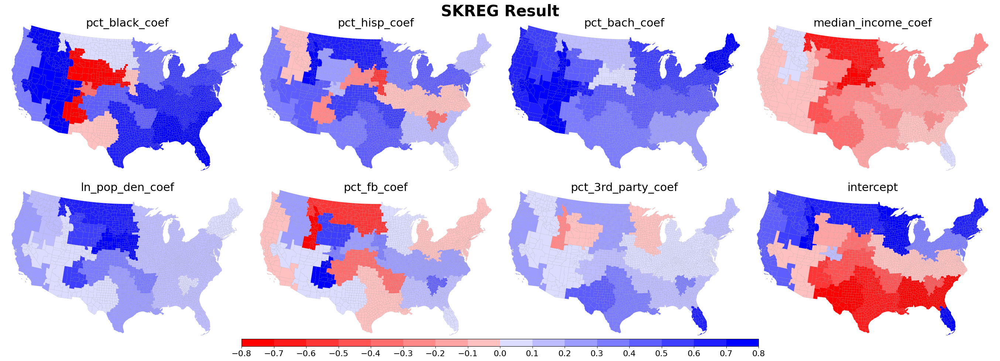

In [6]:
res_path = r"D:\wanghanbin\Linear Regression Tree\code\comparision_paper\Empirical_test\Result\vote_SKREG_result.txt"
df_res = pd.read_csv(res_path, sep="\t")
df_res['county_id'] = df_vote['county_id'].to_numpy()

poly = us_county.merge(df_res[["county_id"] + coef_fields], on="county_id", how="inner")

TARGET_CRS = "EPSG:4326"
poly = poly.to_crs(TARGET_CRS)

plot_maps(
    df=df_res,
    fields=coef_fields,
    title = "SKREG Result",
    #save_path=r"",
    poly_gdf=poly
)

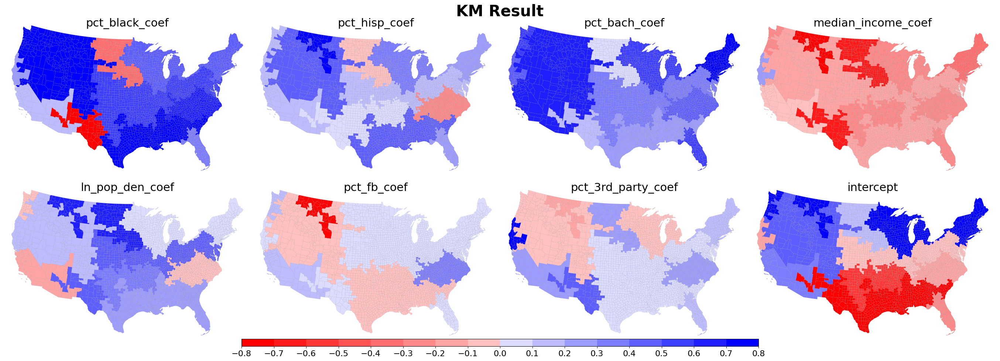

In [7]:
res_path = r"D:\wanghanbin\Linear Regression Tree\code\comparision_paper\Empirical_test\Result\vote_KM_result.txt"
df_res = pd.read_csv(res_path, sep="\t")
df_res['county_id'] = df_vote['county_id'].to_numpy()

poly = us_county.merge(df_res[["county_id"] + coef_fields], on="county_id", how="inner")
poly = poly.to_crs(TARGET_CRS)

plot_maps(
    df=df_res,
    fields=coef_fields,
    title = "KM Result",
    #save_path=r"",
    poly_gdf=poly
)

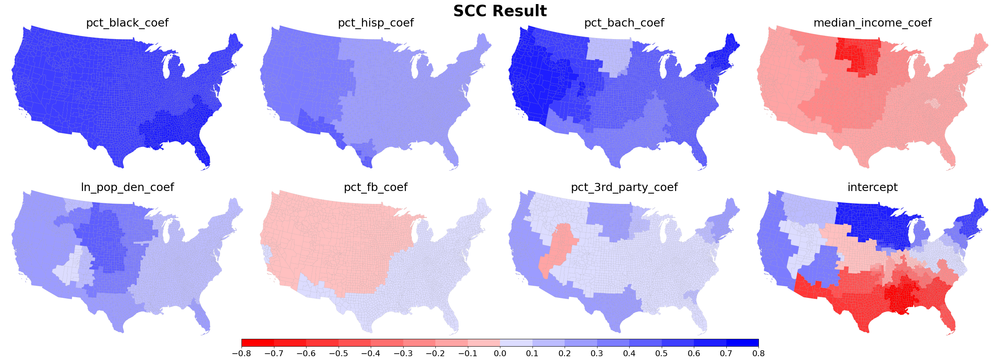

In [11]:
res_path = r"D:\wanghanbin\Linear Regression Tree\code\comparision_paper\Empirical_test\Result\vote_SCC_result_222.txt"
df_res = pd.read_csv(res_path, sep="\t")
df_res['county_id'] = df_vote['county_id'].to_numpy()

poly = us_county.merge(df_res[["county_id"] + coef_fields], on="county_id", how="inner")
poly = poly.to_crs(TARGET_CRS)

plot_maps(
    df=df_res,
    fields=coef_fields,
    title = "SCC Result",
    #save_path=r"",
    poly_gdf=poly
)

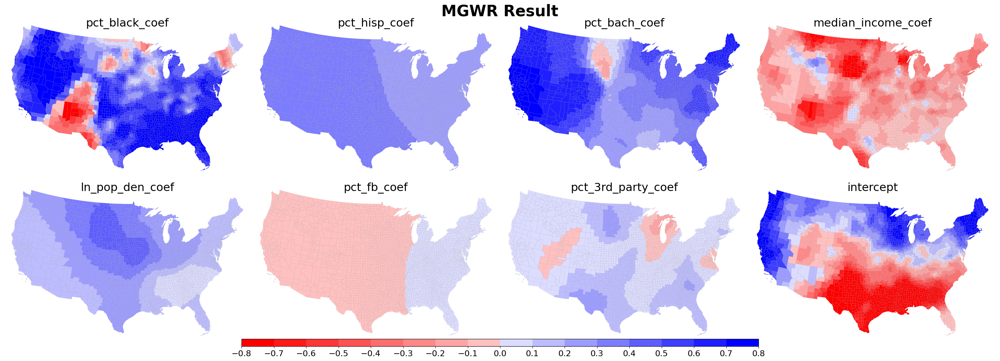

In [16]:
res_path = r"D:\wanghanbin\Linear Regression Tree\code\comparision_paper\Empirical_test\Result\vote_MGWR_result_2.txt"
df_res = pd.read_csv(res_path, sep="\t")
df_res['county_id'] = df_vote['county_id'].to_numpy()

poly = us_county.merge(df_res[["county_id"] + coef_fields], on="county_id", how="inner")
poly = poly.to_crs(TARGET_CRS)

plot_maps(
    df=df_res,
    fields=coef_fields,
    title = "MGWR Result",
    #save_path=r"",
    poly_gdf=poly
)

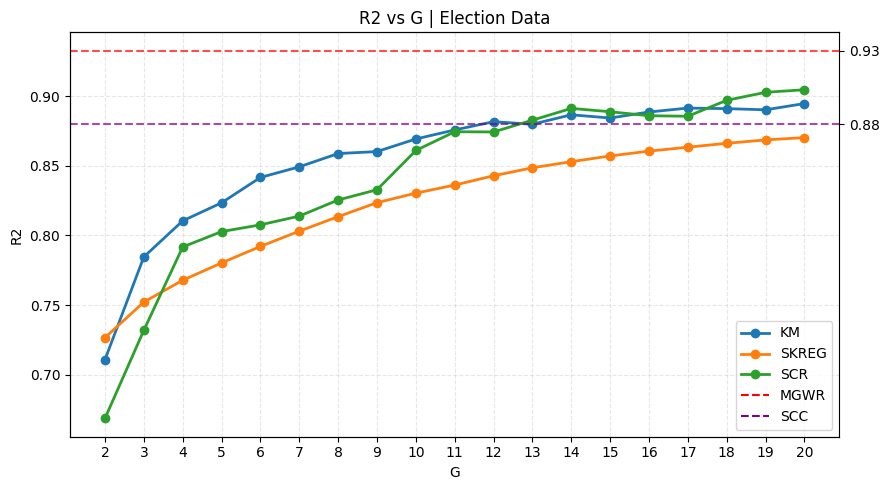

In [61]:
plot_metric(
    base_dir=dir_name,
    file_names=file_names,
    labels=labels,
    metric_col="R2",
    title="R2 vs G | Election Data",
    legend_pos="lower right",
    mgwr_txt=r"D:\wanghanbin\Linear Regression Tree\code\comparision_paper\On endogenous spatial regimes regression_Data\Emp\Emp_Result\index\mgwr.txt",
    scc_txt=r"D:\wanghanbin\Linear Regression Tree\code\comparision_paper\On endogenous spatial regimes regression_Data\Emp\Emp_Result\index\scc.txt")

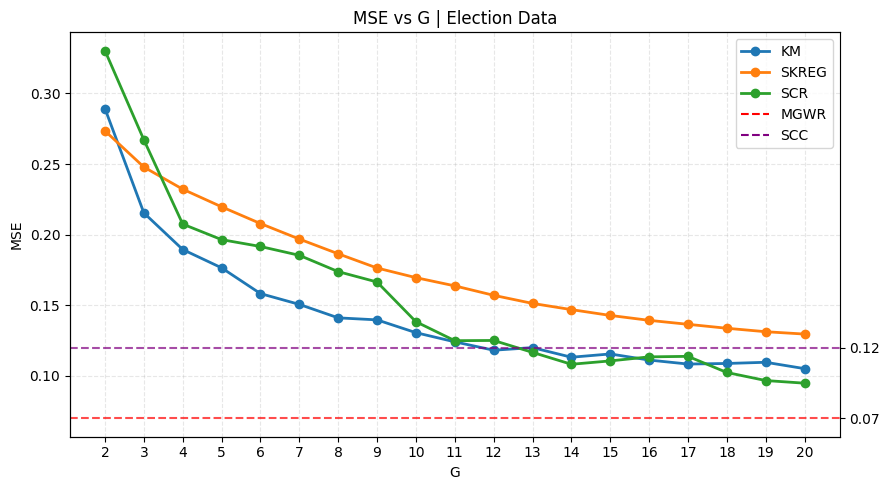

In [62]:
plot_metric(
    base_dir=dir_name,
    file_names=file_names,
    labels=labels,
    metric_col="MSE",
    title="MSE vs G | Election Data",
    legend_pos="upper right",
    mgwr_txt=r"D:\wanghanbin\Linear Regression Tree\code\comparision_paper\On endogenous spatial regimes regression_Data\Emp\Emp_Result\index\mgwr.txt",
    scc_txt=r"D:\wanghanbin\Linear Regression Tree\code\comparision_paper\On endogenous spatial regimes regression_Data\Emp\Emp_Result\index\scc.txt")

### Adjusted Significance test

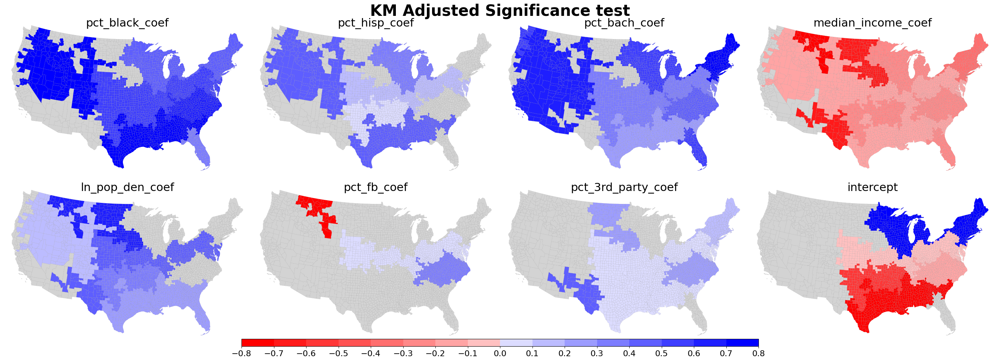

In [66]:
res_path = r"D:\wanghanbin\Linear Regression Tree\code\comparision_paper\On endogenous spatial regimes regression_Data\Emp\Emp_Result\sig_test\vote_KM_result_sig.txt"
df_res = pd.read_csv(res_path, sep="\t")
df_res['county_id'] = df_vote['county_id'].to_numpy()

poly = us_county.merge(df_res[["county_id"] + coef_fields], on="county_id", how="inner")
poly = poly.to_crs(TARGET_CRS)

plot_maps(
    df=df_res,
    fields=coef_fields,
    title = "KM Adjusted Significance test",
    #save_path=r"",
    poly_gdf=poly
)

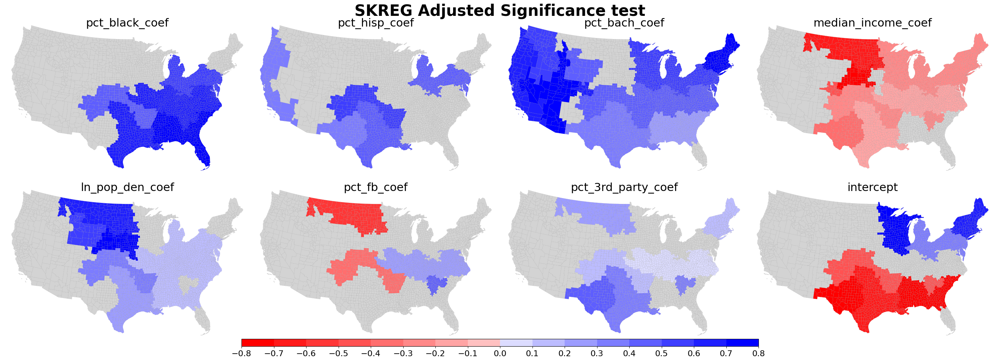

In [67]:
res_path = r"D:\wanghanbin\Linear Regression Tree\code\comparision_paper\On endogenous spatial regimes regression_Data\Emp\Emp_Result\sig_test\vote_SKREG_result_sig.txt"
df_res = pd.read_csv(res_path, sep="\t")
df_res['county_id'] = df_vote['county_id'].to_numpy()

poly = us_county.merge(df_res[["county_id"] + coef_fields], on="county_id", how="inner")
poly = poly.to_crs(TARGET_CRS)

plot_maps(
    df=df_res,
    fields=coef_fields,
    title = "SKREG Adjusted Significance test",
    #save_path=r"",
    poly_gdf=poly
)

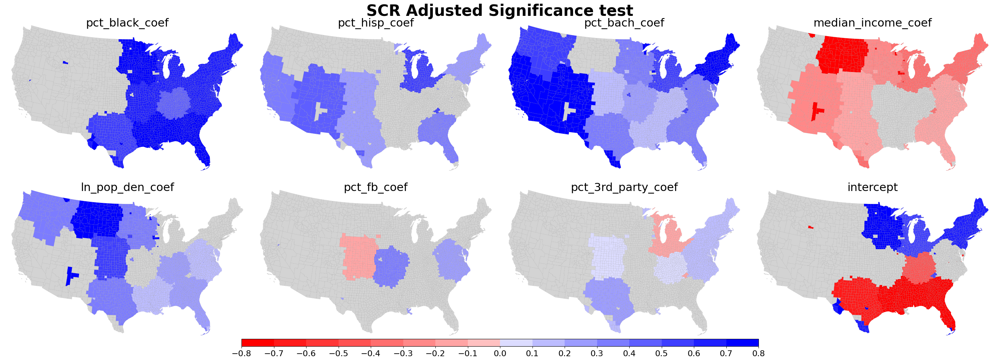

In [68]:
res_path = r"D:\wanghanbin\Linear Regression Tree\code\comparision_paper\On endogenous spatial regimes regression_Data\Emp\Emp_Result\sig_test\vote_SCR_result_sig.txt"
df_res = pd.read_csv(res_path, sep="\t")
df_res['county_id'] = df_vote['county_id'].to_numpy()

poly = us_county.merge(df_res[["county_id"] + coef_fields], on="county_id", how="inner")
poly = poly.to_crs(TARGET_CRS)

plot_maps(
    df=df_res,
    fields=coef_fields,
    title = "SCR Adjusted Significance test",
    #save_path=r"",
    poly_gdf=poly
)

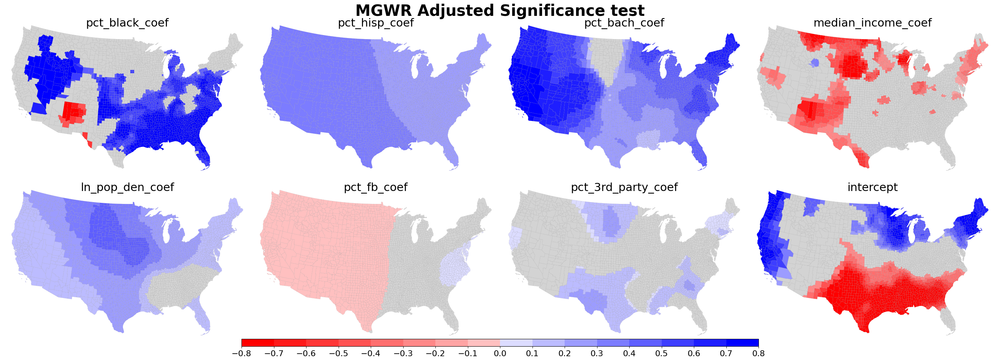

In [69]:
res_path = r"D:\wanghanbin\Linear Regression Tree\code\comparision_paper\On endogenous spatial regimes regression_Data\Emp\Emp_Result\sig_test\vote_MGWR_result_sig.txt"
df_res = pd.read_csv(res_path, sep="\t")
df_res['county_id'] = df_vote['county_id'].to_numpy()

poly = us_county.merge(df_res[["county_id"] + coef_fields], on="county_id", how="inner")
poly = poly.to_crs(TARGET_CRS)

plot_maps(
    df=df_res,
    fields=coef_fields,
    title = "MGWR Adjusted Significance test",
    #save_path=r"",
    poly_gdf=poly
)